In [5]:
import pandas as pd

In [6]:
df = pd.read_csv('symptoms_with_labels.csv')

In [7]:
df

,VAERS_ID,VAX_TYPE,SYMPTOM_TEXT,V_ADMINBY,FORM_VERS,SYMPTOM_LIST
0,2728994,COVID19,muscle at the injection site is sore he cannot...,PHM,2,"['sore', 'muscle pain', 'arexvy', 'coronavirus..."
1,2729004,COVID19,micro-seizures starting approximately 2 weeks ...,OTH,2,"['seizures', 'arrest', 'seizure', 'auto-immune..."
2,2729006,COVID19,on september 14 2023 i was admitted to hospita...,PHM,2,"['endocarditis', 'fever', 'chills', 'infection']"
3,2729010,COVID19-2,0300 12/30/23 fever 102 degrees by oral thermo...,PHM,2,"['fever', 'pains fatigue chills', 'diarrhea lo..."
4,2729014,COVID19-2,patients husband reported symptoms of prolonge...,PHM,2,['prolonged shoulder pain']
...,...,...,...,...,...,...
15899,2802236,COVID19,covid pfizer vaccine was stored in the freezer...,UNK,2,[]
15900,2802237,COVID19,covid pfizer vaccine was stored in the freezer...,UNK,2,[]
15901,2802238,COVID19,covid pfizer vaccine was stored in the freezer...,UNK,2,[]
15902,2802239,COVID19,covid pfizer vaccine was stored in the freezer...,UNK,2,[]


In [8]:
for i, row in df.iterrows():
    print(row['SYMPTOM_TEXT'])
    print(row['SYMPTOM_LIST'])

muscle at the injection site is sore he cannot lift anything more than 5 pounds arm soreness this non-serious case was reported by a consumer via call center representative and described the occurrence of injection site muscle pain in a adult male patient who received rsvpref3 adjuvanted arexvy for prophylaxis co-suspect products included influenza vaccine for prophylaxis and tozinameran pfizer biontech coronavirus disease 2019 vaccine for prophylaxis on an unknown date the patient received arexvy right arm influenza vaccine left arm and pfizer biontech coronavirus disease 2019 vaccine left arm on an unknown date an unknown time after receiving arexvy the patient experienced injection site muscle pain verbatim muscle at the injection site is sore activities of daily living impaired verbatim he cannot lift anything more than 5 pounds and pain in arm verbatim arm soreness the outcome of the injection site muscle pain and activities of daily living impaired were not reported and the outco

In [9]:

# Display the updated DataFrame to check the new column names
print(df.head())

   VAERS_ID   VAX_TYPE                                       SYMPTOM_TEXT   
0   2728994    COVID19  muscle at the injection site is sore he cannot...  \
1   2729004    COVID19  micro-seizures starting approximately 2 weeks ...   
2   2729006    COVID19  on september 14 2023 i was admitted to hospita...   
3   2729010  COVID19-2  0300 12/30/23 fever 102 degrees by oral thermo...   
4   2729014  COVID19-2  patients husband reported symptoms of prolonge...   

  V_ADMINBY  FORM_VERS                                       SYMPTOM_LIST  
0       PHM          2  ['sore', 'muscle pain', 'arexvy', 'coronavirus...  
1       OTH          2  ['seizures', 'arrest', 'seizure', 'auto-immune...  
2       PHM          2   ['endocarditis', 'fever', 'chills', 'infection']  
3       PHM          2  ['fever', 'pains fatigue chills', 'diarrhea lo...  
4       PHM          2                        ['prolonged shoulder pain']  


In [11]:
df = df[['VAERS_ID', 'SYMPTOM_TEXT', 'SYMPTOM_LIST']]

In [12]:
df['SYMPTOM_LIST'] = df['SYMPTOM_LIST'].fillna('[]')

/var/folders/ck/hmsclsfj6y1d_pbb28pqpv_h0000gn/T/ipykernel_51713/315920327.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SYMPTOM_LIST'] = df['SYMPTOM_LIST'].fillna('[]')


In [13]:
# Length of symptom texts
df['SYMPTOM_TEXT_LENGTH'] = df['SYMPTOM_TEXT'].str.len()
df['SYMPTOM_LIST_LENGTH'] = df['SYMPTOM_LIST'].apply(lambda x: len(x))  # Assumes string representation of a list
print("\nLength of SYMPTOM_TEXT and SYMPTOM_LIST added to DataFrame.")



Length of SYMPTOM_TEXT and SYMPTOM_LIST added to DataFrame.


/var/folders/ck/hmsclsfj6y1d_pbb28pqpv_h0000gn/T/ipykernel_51713/2055032420.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SYMPTOM_TEXT_LENGTH'] = df['SYMPTOM_TEXT'].str.len()
/var/folders/ck/hmsclsfj6y1d_pbb28pqpv_h0000gn/T/ipykernel_51713/2055032420.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SYMPTOM_LIST_LENGTH'] = df['SYMPTOM_LIST'].apply(lambda x: len(x))  # Assumes string representation of a list


In [14]:
# Filter out rows where 'SYMPTOM_LIST' is exactly "[]"
df1 = df[df['SYMPTOM_LIST'] != "[]"]

for symptom_list in df1['SYMPTOM_LIST']:
    x = symptom_list.strip('[]')
    symptoms = [symptom.strip().strip("'") for symptom in x.split(',')]
    print(symptoms)



['sore', 'muscle pain', 'arexvy', 'coronavirus disease 2019', 'coronavirus disease 2019', 'muscle pain', 'sore', 'pain', 'muscle pain', 'pain', 'muscle pain', 'pain', 'arexvy', 'muscle pain', 'pain', 'arexvy', 'coronavirus disease 2019', 'sore']
['seizures', 'arrest', 'seizure', 'auto-immune disease', 'encephalitis']
['endocarditis', 'fever', 'chills', 'infection']
['fever', 'pains fatigue chills', 'diarrhea loss', 'fatigue diarhea loss']
['prolonged shoulder pain']
['respiratory failure s/p trach placement 8/17/2023 gerd hypertension', 'shortness of breath', 'fevers', 'muscular dystrophy', 'respiratory distress', 'sepsis', 'pneumonia', 'infections', 'eating disorder', 'tachycardia', 'hypotensive', 'culturesurine antigens methicillin-resistant staphylococcus aureus', 'neginitial lactic acid 08 covid swab positive isolation precautions started', 'infectious diseases', 'coronavirus disease', 'urinary incontinence', 'urinary retention', 'overflow incontinence', 'hypomagnesemia', 'left sho

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud


# 1. Basic Overview
print("First few rows of the dataset:")
print(df1.head())




First few rows of the dataset:
   VAERS_ID                                       SYMPTOM_TEXT   
0   2728994  muscle at the injection site is sore he cannot...  \
1   2729004  micro-seizures starting approximately 2 weeks ...   
2   2729006  on september 14 2023 i was admitted to hospita...   
3   2729010  0300 12/30/23 fever 102 degrees by oral thermo...   
4   2729014  patients husband reported symptoms of prolonge...   

                                        SYMPTOM_LIST  SYMPTOM_TEXT_LENGTH   
0  ['sore', 'muscle pain', 'arexvy', 'coronavirus...               1894.0  \
1  ['seizures', 'arrest', 'seizure', 'auto-immune...                647.0   
2   ['endocarditis', 'fever', 'chills', 'infection']                688.0   
3  ['fever', 'pains fatigue chills', 'diarrhea lo...                211.0   
4                        ['prolonged shoulder pain']                144.0   

   SYMPTOM_LIST_LENGTH  
0                  245  
1                   72  
2                   48  
3        

In [16]:
# 2. Summary Statistics
print("\nData types and non-null counts:")
print(df1.info())
print("\nDescriptive statistics:")
print(df1.describe(include='all'))


Data types and non-null counts:
<class 'pandas.core.frame.DataFrame'>
Index: 11606 entries, 0 to 15897
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   VAERS_ID             11606 non-null  int64  
 1   SYMPTOM_TEXT         11606 non-null  object 
 2   SYMPTOM_LIST         11606 non-null  object 
 3   SYMPTOM_TEXT_LENGTH  11606 non-null  float64
 4   SYMPTOM_LIST_LENGTH  11606 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 544.0+ KB
None

Descriptive statistics:
            VAERS_ID                                       SYMPTOM_TEXT   
count   1.160600e+04                                              11606  \
unique           NaN                                              11316   
top              NaN  administration error gave expired vaccine we h...   
freq             NaN                                                 48   
mean    2.765487e+06                         

In [17]:


# Count unique values
print("\nUnique counts for each column:")
print(df1.nunique())



Unique counts for each column:
VAERS_ID               11606
SYMPTOM_TEXT           11316
SYMPTOM_LIST            8931
SYMPTOM_TEXT_LENGTH     3253
SYMPTOM_LIST_LENGTH      931
dtype: int64


In [18]:

# 3. Missing Values
print("\nMissing values in each column:")
print(df1.isnull().sum())



Missing values in each column:
VAERS_ID               0
SYMPTOM_TEXT           0
SYMPTOM_LIST           0
SYMPTOM_TEXT_LENGTH    0
SYMPTOM_LIST_LENGTH    0
dtype: int64


In [19]:
# 4. Data Distribution
# Value counts of symptoms
print("\nValue counts for symptom lists:")
print(df1['SYMPTOM_LIST'].value_counts().head(10))  # Top 10 most frequent symptoms



Value counts for symptom lists:
SYMPTOM_LIST
['coronavirus disease']                                                                                                346
['pain']                                                                                                               140
['coronavirus disease', 'coronavirus disease']                                                                          93
['rash']                                                                                                                83
['covid vaccine']                                                                                                       80
['tinnitus']                                                                                                            60
['coronavirus disease', 'coronavirus disease', 'coronavirus disease', 'coronavirus disease', 'coronavirus disease']     55
['death']                                                                                    

In [20]:
df1

,VAERS_ID,SYMPTOM_TEXT,SYMPTOM_LIST,SYMPTOM_TEXT_LENGTH,SYMPTOM_LIST_LENGTH
0,2728994,muscle at the injection site is sore he cannot...,"['sore', 'muscle pain', 'arexvy', 'coronavirus...",1894.0,245
1,2729004,micro-seizures starting approximately 2 weeks ...,"['seizures', 'arrest', 'seizure', 'auto-immune...",647.0,72
2,2729006,on september 14 2023 i was admitted to hospita...,"['endocarditis', 'fever', 'chills', 'infection']",688.0,48
3,2729010,0300 12/30/23 fever 102 degrees by oral thermo...,"['fever', 'pains fatigue chills', 'diarrhea lo...",211.0,74
4,2729014,patients husband reported symptoms of prolonge...,['prolonged shoulder pain'],144.0,27
...,...,...,...,...,...
15875,2802200,very sore arm and swelling large hard lump at ...,"['sore', 'swelling']",154.0,20
15894,2802224,within 1 hour of vaccine pt had l calf and low...,"['lower leg swelling pain', 'venous thrombosis...",223.0,56
15895,2802168,menstrual cycle stopped fertility issues this ...,"['infertility', 'amenorrhea', 'complaint']",1883.0,42
15896,2802232,vitiligo this spontaneous report received from...,"['vitiligo', 'vitiligo', 'vitiligo']",726.0,36


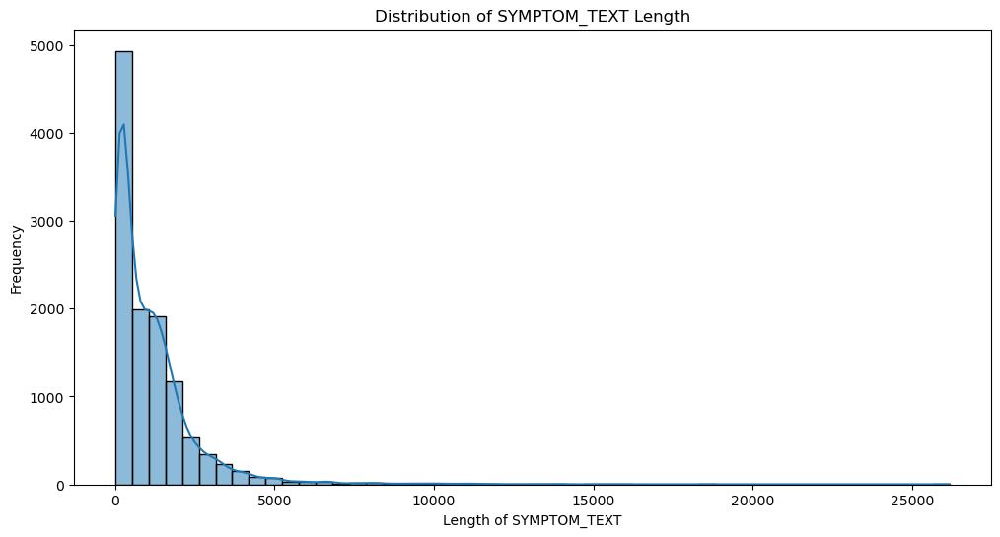

In [21]:

# Visualizing lengths
plt.figure(figsize=(12, 6))
sns.histplot(df1['SYMPTOM_TEXT_LENGTH'], bins=50, kde=True)
plt.title('Distribution of SYMPTOM_TEXT Length')
plt.xlabel('Length of SYMPTOM_TEXT')
plt.ylabel('Frequency')
plt.show()

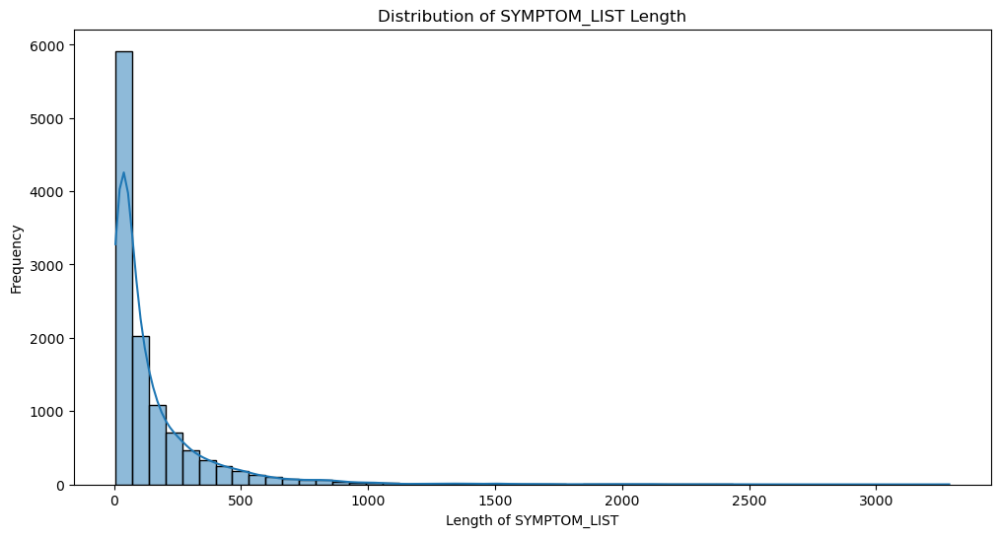

In [22]:

plt.figure(figsize=(12, 6))
sns.histplot(df1['SYMPTOM_LIST_LENGTH'], bins=50, kde=True)
plt.title('Distribution of SYMPTOM_LIST Length')
plt.xlabel('Length of SYMPTOM_LIST')
plt.ylabel('Frequency')
plt.show()

In [23]:
# 5. Duplicates
print("\nNumber of duplicate rows:")
print(df1.duplicated().sum())


Number of duplicate rows:
0


In [ ]:
# 6. Data Quality Checks
df1['SYMPTOM_TEXT'] = df1['SYMPTOM_TEXT'].str.strip()  # Remove leading/trailing whitespace
df1['SYMPTOM_TEXT'] = df1['SYMPTOM_TEXT'].str.lower() 
df1['SYMPTOM_LIST'] = df1['SYMPTOM_LIST'].str.lower()  # Convert to lowercase


/var/folders/ck/hmsclsfj6y1d_pbb28pqpv_h0000gn/T/ipykernel_51713/163987829.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['SYMPTOM_TEXT'] = df1['SYMPTOM_TEXT'].str.strip()  # Remove leading/trailing whitespace
/var/folders/ck/hmsclsfj6y1d_pbb28pqpv_h0000gn/T/ipykernel_51713/163987829.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['SYMPTOM_TEXT'] = df1['SYMPTOM_TEXT'].str.lower()
/var/folders/ck/hmsclsfj6y1d_pbb28pqpv_h0000gn/T/ipykernel_51713/163987829.py:5: SettingWithCopyWarning: 
A valu

In [25]:
df1

,VAERS_ID,SYMPTOM_TEXT,SYMPTOM_LIST,SYMPTOM_TEXT_LENGTH,SYMPTOM_LIST_LENGTH
0,2728994,muscle at the injection site is sore he cannot...,"['sore', 'muscle pain', 'arexvy', 'coronavirus...",1894.0,245
1,2729004,micro-seizures starting approximately 2 weeks ...,"['seizures', 'arrest', 'seizure', 'auto-immune...",647.0,72
2,2729006,on september 14 2023 i was admitted to hospita...,"['endocarditis', 'fever', 'chills', 'infection']",688.0,48
3,2729010,0300 12/30/23 fever 102 degrees by oral thermo...,"['fever', 'pains fatigue chills', 'diarrhea lo...",211.0,74
4,2729014,patients husband reported symptoms of prolonge...,['prolonged shoulder pain'],144.0,27
...,...,...,...,...,...
15875,2802200,very sore arm and swelling large hard lump at ...,"['sore', 'swelling']",154.0,20
15894,2802224,within 1 hour of vaccine pt had l calf and low...,"['lower leg swelling pain', 'venous thrombosis...",223.0,56
15895,2802168,menstrual cycle stopped fertility issues this ...,"['infertility', 'amenorrhea', 'complaint']",1883.0,42
15896,2802232,vitiligo this spontaneous report received from...,"['vitiligo', 'vitiligo', 'vitiligo']",726.0,36


/var/folders/ck/hmsclsfj6y1d_pbb28pqpv_h0000gn/T/ipykernel_51713/3043723193.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['SYMPTOM_LIST'] = df1['SYMPTOM_LIST'].apply(lambda x: list(set(eval(x))) if isinstance(x, str) else x)


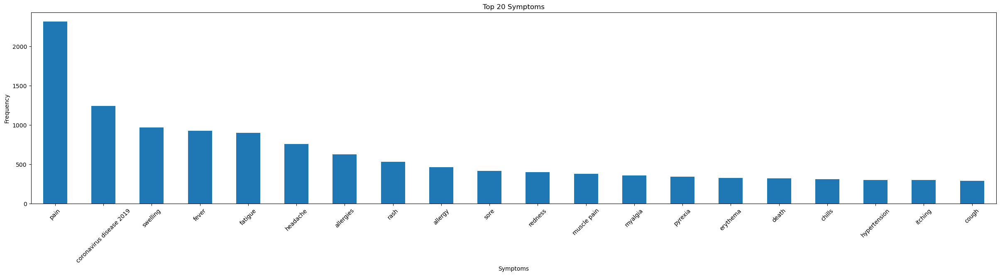

In [ ]:

# 7. Visualizations
excluded_words = {'patient', 'patients', 'vaccine', 'medical history','symptoms','treatment','administered', 'information', 'medications','batch/lot number','vaccination','coronavirus disease','outcome', 'dose','consumer', 'age','female','days','day','medically significant','requested','vaccines','male', 'years', 'time', 'formula'}

df1['SYMPTOM_LIST'] = df1['SYMPTOM_LIST'].apply(lambda x: list(set(eval(x))) if isinstance(x, str) else x)

filtered_symptoms = df1['SYMPTOM_LIST'].explode().dropna()
filtered_symptoms = filtered_symptoms[~filtered_symptoms.isin(excluded_words)]

# Get the frequency counts of the remaining symptoms
symptom_counts = filtered_symptoms.value_counts()

# Plot the top 5 symptoms
plt.figure(figsize=(30, 6))
symptom_counts[:20].plot(kind='bar')
plt.title('Top 20 Symptoms')
plt.xlabel('Symptoms')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()



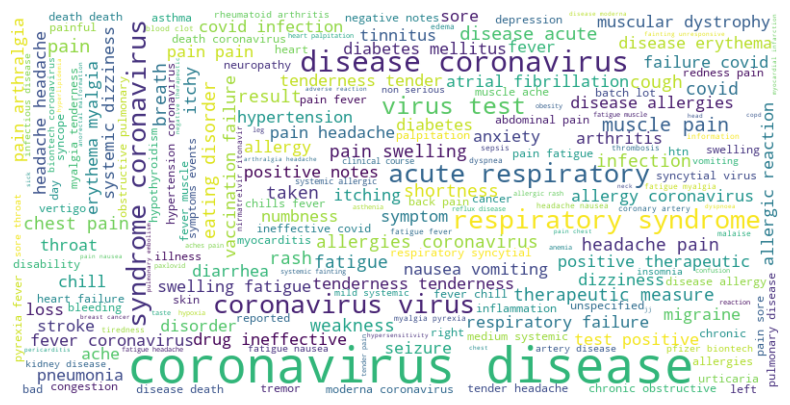

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def get_unique_symptoms(symptom_list):
    if isinstance(symptom_list, str): 
        try:
            symptom_list = eval(symptom_list)  
        except (SyntaxError, NameError):  
            return ''
    elif not isinstance(symptom_list, list): 
        return ''

    unique_symptoms = set(symptom_list)
    return ' '.join(unique_symptoms)


unique_symptoms_list = df1['SYMPTOM_LIST'].apply(get_unique_symptoms)

text_for_word_cloud = ' '.join(unique_symptoms_list)

excluded_words = {'WAS', 'CAN', 'patient', 'patients', 'vaccine', 'dose', 'lot', 'number', 'year', 'significant'}

filtered_text = ' '.join(word for word in text_for_word_cloud.split() if word.lower() not in excluded_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(filtered_text)


plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In [29]:
df1['SYMPTOM_TEXT'] = df1['SYMPTOM_LIST'].fillna(' ')

/var/folders/ck/hmsclsfj6y1d_pbb28pqpv_h0000gn/T/ipykernel_51713/2474651503.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['SYMPTOM_TEXT'] = df1['SYMPTOM_LIST'].fillna(' ')


Associative Analysis


In [34]:
import pandas as pd
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from collections import Counter
# Step 1: Create a Grand Dictionary of Symptoms
# Assuming df1['SYMPTOM_LIST'] contains lists of symptoms
symptom_list = df1['SYMPTOM_LIST'].explode()  # Flatten the list of lists
symptom_counts = Counter(symptom_list)         # Count each symptom occurrence
grand_dict_of_symptoms = dict(symptom_counts) 

In [35]:
grand_dict_of_symptoms

{'pain': 2317,
 'sore': 414,
 'coronavirus disease 2019': 1242,
 'muscle pain': 377,
 'arexvy': 17,
 'encephalitis': 12,
 'arrest': 2,
 'seizures': 46,
 'seizure': 94,
 'auto-immune disease': 2,
 'chills': 311,
 'infection': 285,
 'fever': 926,
 'endocarditis': 2,
 'pains fatigue chills': 1,
 'diarrhea loss': 1,
 'fatigue diarhea loss': 1,
 'prolonged shoulder pain': 1,
 'respiratory distress': 17,
 'urinary incontinence': 8,
 'shortness of breath': 253,
 'fevers': 17,
 'muscular dystrophy': 170,
 'sepsis': 81,
 'infections': 24,
 'infectious diseases': 70,
 'coronavirus disease': 4192,
 'hypotensive': 9,
 'tachycardia': 74,
 'anxiety': 167,
 'eating disorder': 251,
 'left shoulder pain xray shoulder chronic separation of the left acromioclavicular joint open prostatectomy f/u': 1,
 'gastroesophageal reflux disease': 18,
 'left shoulder pain': 8,
 'respiratory failure s/p trach placement 8/17/2023 gerd hypertension': 1,
 'pneumonia': 203,
 'trauma': 35,
 'neginitial lactic acid 08 covi

In [ ]:
import ast

df1['SYMPTOM_LIST'] = df1['SYMPTOM_LIST'].apply(lambda x: ast.literal_eval(x.strip()) if isinstance(x, str) else x)

df1['SYMPTOM_LIST'] = df1['SYMPTOM_LIST'].apply(lambda x: x.strip('[]').split(', ') if isinstance(x, str) else x)

print(df1[['VAERS_ID', 'SYMPTOM_LIST']])

       VAERS_ID                                       SYMPTOM_LIST
0       2728994  [pain, sore, coronavirus disease 2019, muscle ...
1       2729004  [encephalitis, arrest, seizures, seizure, auto...
2       2729006           [chills, infection, fever, endocarditis]
3       2729010  [pains fatigue chills, diarrhea loss, fever, f...
4       2729014                          [prolonged shoulder pain]
...         ...                                                ...
15875   2802200                                   [swelling, sore]
15894   2802224  [lower leg swelling pain, pain, venous thrombo...
15895   2802168               [complaint, infertility, amenorrhea]
15896   2802232                                         [vitiligo]
15897   2802233  [symptoms/events, tinnitus, vessel disease, co...

[11606 rows x 2 columns]


/var/folders/ck/hmsclsfj6y1d_pbb28pqpv_h0000gn/T/ipykernel_51713/1433918512.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['SYMPTOM_LIST'] = df1['SYMPTOM_LIST'].apply(lambda x: ast.literal_eval(x.strip()) if isinstance(x, str) else x)
/var/folders/ck/hmsclsfj6y1d_pbb28pqpv_h0000gn/T/ipykernel_51713/1433918512.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['SYMPTOM_LIST'] = df1['SYMPTOM_LIST'].apply(lambda x: x.strip('[]').split(', ') if isinstance(x, str) else x)


In [ ]:

symptom_dummies = df1['SYMPTOM_LIST'].apply(lambda x: pd.Series(1, index=set(x))).fillna(0)

frequent_itemsets = apriori(symptom_dummies, min_support=0.01, use_colnames=True)

rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.5)

print("Grand Dictionary of Symptoms:", grand_dict_of_symptoms)
print("Frequent Itemsets:", frequent_itemsets)
print("Association Rules:", rules)


/Users/snehadharne/anaconda3/lib/python3.11/site-packages/mlxtend/frequent_patterns/fpcommon.py:109: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


Grand Dictionary of Symptoms: {'pain': 2317, 'sore': 414, 'coronavirus disease 2019': 1242, 'muscle pain': 377, 'arexvy': 17, 'encephalitis': 12, 'arrest': 2, 'seizures': 46, 'seizure': 94, 'auto-immune disease': 2, 'chills': 311, 'infection': 285, 'fever': 926, 'endocarditis': 2, 'pains fatigue chills': 1, 'diarrhea loss': 1, 'fatigue diarhea loss': 1, 'prolonged shoulder pain': 1, 'respiratory distress': 17, 'urinary incontinence': 8, 'shortness of breath': 253, 'fevers': 17, 'muscular dystrophy': 170, 'sepsis': 81, 'infections': 24, 'infectious diseases': 70, 'coronavirus disease': 4192, 'hypotensive': 9, 'tachycardia': 74, 'anxiety': 167, 'eating disorder': 251, 'left shoulder pain xray shoulder chronic separation of the left acromioclavicular joint open prostatectomy f/u': 1, 'gastroesophageal reflux disease': 18, 'left shoulder pain': 8, 'respiratory failure s/p trach placement 8/17/2023 gerd hypertension': 1, 'pneumonia': 203, 'trauma': 35, 'neginitial lactic acid 08 covid swab 

In [38]:
frequent_itemsets

,support,itemsets
0,0.199638,(pain)
1,0.035671,(sore)
2,0.107014,(coronavirus disease 2019)
3,0.032483,(muscle pain)
4,0.026796,(chills)
...,...,...
616,0.010598,"(pain, swelling, fever, muscle pain, fatigue, ..."
617,0.010770,"(erythema, pain, fever, muscle pain, fatigue, ..."
618,0.010426,"(erythema, pain, swelling, fever, muscle pain,..."
619,0.010426,"(erythema, pain, swelling, fever, muscle pain,..."


In [39]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(muscle pain),(pain),0.032483,0.199638,0.029381,0.904509,4.530744,0.022896,8.381567,0.805449
1,(fatigue),(pain),0.077460,0.199638,0.043081,0.556174,2.785908,0.027617,1.803322,0.694876
2,(headache),(pain),0.065225,0.199638,0.034206,0.524439,2.626946,0.021185,1.682983,0.662544
3,(myalgia),(pain),0.030760,0.199638,0.028003,0.910364,4.560072,0.021862,8.929037,0.805482
4,(arthralgia),(pain),0.020679,0.199638,0.018956,0.916667,4.591641,0.014827,9.604343,0.798730
...,...,...,...,...,...,...,...,...,...,...
6630,"(headache, swelling)","(pain, fatigue, muscle pain, erythema, myalgia)",0.017922,0.014389,0.010167,0.567308,39.426186,0.009909,2.277856,0.992422
6631,"(headache, muscle pain)","(erythema, pain, swelling, fatigue, myalgia)",0.018008,0.012580,0.010167,0.564593,44.881300,0.009941,2.267811,0.995649
6632,"(myalgia, headache)","(erythema, pain, swelling, muscle pain, fatigue)",0.017836,0.013183,0.010167,0.570048,43.241704,0.009932,2.295181,0.994614
6633,"(muscle pain, swelling)","(headache, pain, fatigue, erythema, myalgia)",0.017749,0.010770,0.010167,0.572816,53.184777,0.009976,2.315697,0.998928
